In [17]:
import iris
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import matplotlib.patches as patch
import pandas as pd
import numpy as np
import os
import glob


import cartopy.crs as ccrs
import cartopy.feature as cfeature

from cartopy.mpl.geoaxes import GeoAxes
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import AxesGrid
import matplotlib as mpl

from cartopy.util import add_cyclic_point
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER


import sys
sys.path.insert(0,'/nfs/mary/Users/ee19b2s/work/chapter1/hs1_pmip_proj/classes/')
from simulation_dictionary import tejen, tejeo, deglg, deglh, loveclim, iloveclim, iloveclim_fwf, iloveclim_uniform, iloveclim_fwf_glac, iloveclim_uniform_glac, famous, itrace, trace, mpi08, mpi10, mpi11, mpi12, miroc, uvic_short, uvic_long
import data_SAT_3D_dictionary as ddict_sat
#import data_SST_3D_dictionary as ddict_sst
import variable_dictionary as vdict
sys.path.insert(0,'/nfs/mary/Users/ee19b2s/work/chapter1/hs1_pmip_proj/modules/')
import hadcm3_functions as hf 
import loveclim_functions as lf
import itrace_functions as itf
import functions_for_comparisons as func4comp
import matplotlib.gridspec as gridspec
from regress_func import regress

lon = np.load('/nfs/mary/Users/ee19b2s/work/data/pmip_proj_hs1/1degree_lon.npy')
lat = np.load('/nfs/mary/Users/ee19b2s/work/data/pmip_proj_hs1/1degree_lat.npy')
expt_order_main = [tejen, loveclim, itrace, trace, deglg, mpi10, iloveclim_uniform, iloveclim_uniform_glac, deglh, mpi11, mpi12, iloveclim_fwf, iloveclim_fwf_glac, famous, miroc]
expt_order_main_wUvic = [tejen, loveclim, itrace, trace, deglg, mpi10, iloveclim_uniform, iloveclim_uniform_glac, deglh, mpi11, mpi12, iloveclim_fwf, iloveclim_fwf_glac, famous, miroc, uvic_short, uvic_long]

In [2]:
from functions_for_comparisons import find_nearest_value
import scipy.stats as stats


# fig04: multi-model mean and standard deviation

In [3]:
def calc_anom_for_maps20ka_long_noAVG(variable_to_plot, time, timeperiods = [], lgm_def=20, timestep = 'decadal', ka_scale=True, positive=True, precip = False, absolute = False):
    ''' requires 3d field for anom maps '''
    end_def = lgm_def-0.5
    if ka_scale == True and positive == True:
        lgm = np.ma.average(variable_to_plot[find_nearest_value(time, lgm_def):find_nearest_value(time, end_def),:,:], axis=0)
    elif ka_scale == True and positive == False:
        lgm = np.ma.average(variable_to_plot[find_nearest_value(time, lgm_def*-1):find_nearest_value(time, end_def*-1),:,:], axis=0)
    elif ka_scale == False and positive == True:
        lgm = np.ma.average(variable_to_plot[find_nearest_value(time, lgm_def*1000):find_nearest_value(time, end_def*1000),:,:], axis=0)
    elif ka_scale == False and positive == False:
        lgm = np.ma.average(variable_to_plot[find_nearest_value(time, lgm_def*-1000):find_nearest_value(time, end_def*-1000),:,:], axis=0)
    
    pi = variable_to_plot[find_nearest_value(time, 0),:,:] 
    avgs = []
    
    
    for timeperiod in timeperiods:
        if timestep == 'decadal':
            avgs.append(variable_to_plot[find_nearest_value(time, timeperiod)-3:find_nearest_value(time, timeperiod)+3,:,:])
        elif timestep == 'annual':
            avgs.append(variable_to_plot[find_nearest_value(time, timeperiod)-25:find_nearest_value(time, timeperiod)+25,:,:])
        elif timestep == 'centennial':
            avgs.append(variable_to_plot[find_nearest_value(time, timeperiod),:,:])
        elif timestep == 'monthly':
            avgs.append(variable_to_plot[find_nearest_value(time, timeperiod)-300:find_nearest_value(time, timeperiod)+300,:,:])
        elif timestep == 'seasonal':
            avgs.append(variable_to_plot[find_nearest_value(time, timeperiod)-100:find_nearest_value(time, timeperiod)+100,:,:])
        elif timestep == 'mpi':
            avgs.append(variable_to_plot[find_nearest_value(time, timeperiod)-3:find_nearest_value(time, timeperiod)+3,:,:])
        else:
            print('error: pick different timestep')

    list_of_periods = avgs
    
    if absolute == False:
        ## calculate anomalies from lgm and pi
        anomalies_from_lgm = []
        anomalies_from_pi = []
        
        for period in list_of_periods:
            if precip == True:
                anomalies_from_lgm.append((period - lgm)/lgm)
                anomalies_from_pi.append((period - pi)/pi)
            elif precip == False:
                anomalies_from_lgm.append(period - lgm)
                anomalies_from_pi.append(period - pi)
        
                
        return anomalies_from_lgm, anomalies_from_pi
    elif absolute == True:
        return list_of_periods, None
    

In [4]:

var = 'global_3D_sst10'

to_clip = ddict_sst.iloveclim_fwf[var]
iloveclim_fwf_sst_with_nans = np.zeros((to_clip.shape[0],to_clip.shape[1],to_clip.shape[2]))

for i in range(to_clip.shape[0]):
    for j in range(to_clip.shape[1]):
        for k in range(to_clip.shape[2]):
            if to_clip[i,j,k] >= -100:
                iloveclim_fwf_sst_with_nans[i,j,k] = to_clip[i,j,k]
            else:
                iloveclim_fwf_sst_with_nans[i,j,k] = np.nan

to_clip = ddict_sst.iloveclim_uniform[var]
iloveclim_uni_sst_with_nans = np.zeros((to_clip.shape[0],to_clip.shape[1],to_clip.shape[2]))

for i in range(to_clip.shape[0]):
    for j in range(to_clip.shape[1]):
        for k in range(to_clip.shape[2]):
            if to_clip[i,j,k] >= -100:
                iloveclim_uni_sst_with_nans[i,j,k] = to_clip[i,j,k]
            else:
                iloveclim_uni_sst_with_nans[i,j,k] = np.nan
         

In [5]:
timeperiods_ka = [18, 17, 16, 15]

var = 'global_3D_temp10'
ddict = ddict_sat
if_precip=False
is_absolute=False
tejen_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.tejen[var], tejen['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
#tejeo_anom_from_lgm, _ = func4comp.calc_anom_for_maps(ddict.tejeo[var][:,0,:,:], sdict.tejeo['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


deglg_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.deglg[var], deglg['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
deglh_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.deglh[var], deglh['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

famous_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.famous[var], famous['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

loveclim_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.loveclim[var], loveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim[var], iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_fwf_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim_fwf[var], iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_uni_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim_uniform[var], iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

iloveclim_fwf_glac_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim_fwf_glac[var], iloveclim_fwf_glac['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_uni_glac_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim_uniform_glac[var], iloveclim_uniform_glac['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


itrace_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.itrace[var], itrace['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
trace_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.trace[var], trace['time10_short'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

miroc_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.miroc[var], miroc['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

#mpi08_at_timesteps, _ = func4comp.calc_anom_for_maps(ddict.mpi08[var+'0'], mpi08['time100'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
mpi10_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.mpi10[var], mpi10['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

mpi11_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.mpi11[var], mpi11['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

mpi12_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.mpi12[var], mpi12['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


uvic_short_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.uvic_short[var], uvic_short['time10'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
uvic_long_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.uvic_long[var], uvic_long['time10'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

for file in tejen_at_timesteps:
    mask = np.zeros((file.shape[0], file.shape[1]))
    for i in range(file.shape[0]):
        for j in range(file.shape[1]):
            if file[i,j] < -45:
                file[i,j] = 1
            else:
                pass
for file in famous_at_timesteps:
    mask = np.zeros((file.shape[0], file.shape[1]))
    for i in range(file.shape[0]):
        for j in range(file.shape[1]):
            if file[i,j] < -45:
                file[i,j] = 1
            else:
                pass

            
data_list_sat = [tejen_at_timesteps, loveclim_at_timesteps, itrace_at_timesteps, trace_at_timesteps, deglg_at_timesteps, mpi10_at_timesteps,iloveclim_uni_glac_at_timesteps, iloveclim_uni_at_timesteps, mpi11_at_timesteps, deglh_at_timesteps, iloveclim_fwf_at_timesteps, iloveclim_fwf_glac_at_timesteps, mpi12_at_timesteps, famous_at_timesteps, miroc_at_timesteps]#, uvic_short_at_timesteps, uvic_long_at_timesteps]



In [6]:
'''
var = 'global_3D_sst10'

to_clip = ddict_sst.iloveclim_fwf[var]
iloveclim_fwf_sst_with_nans = np.zeros((to_clip.shape[0],to_clip.shape[1],to_clip.shape[2]))

for i in range(to_clip.shape[0]):
    for j in range(to_clip.shape[1]):
        for k in range(to_clip.shape[2]):
            if to_clip[i,j,k] >= -100:
                iloveclim_fwf_sst_with_nans[i,j,k] = to_clip[i,j,k]
            else:
                iloveclim_fwf_sst_with_nans[i,j,k] = np.nan

to_clip = ddict_sst.iloveclim_uniform[var]
iloveclim_uni_sst_with_nans = np.zeros((to_clip.shape[0],to_clip.shape[1],to_clip.shape[2]))

for i in range(to_clip.shape[0]):
    for j in range(to_clip.shape[1]):
        for k in range(to_clip.shape[2]):
            if to_clip[i,j,k] >= -100:
                iloveclim_uni_sst_with_nans[i,j,k] = to_clip[i,j,k]
            else:
                iloveclim_uni_sst_with_nans[i,j,k] = np.nan
                
 '''         
                
timeperiods_ka = [18, 17, 16, 15]

var = 'global_3D_sst10'
ddict = ddict_sst
if_precip=False
is_absolute=False
tejen_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.tejen[var], tejen['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
#tejeo_anom_from_lgm, _ = func4comp.calc_anom_for_maps(ddict.tejeo[var][:,0,:,:], sdict.tejeo['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


deglg_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.deglg[var], deglg['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
deglh_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.deglh[var], deglh['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

famous_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.famous[var], famous['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

loveclim_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.loveclim[var], loveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

iloveclim_fwf_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(iloveclim_fwf_sst_with_nans, iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_uni_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(iloveclim_uni_sst_with_nans, iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

iloveclim_fwf_glac_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.iloveclim_fwf_glac[var], iloveclim_fwf_glac['time10'][0:910], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_uni_glac_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.iloveclim_uniform_glac[var], iloveclim_uniform_glac['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


itrace_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.itrace[var], itrace['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
trace_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.trace[var], trace['time10_short'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

miroc_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.miroc[var], miroc['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

#mpi08_at_timesteps, _ = func4comp.calc_anom_for_maps(ddict.mpi08[var+'0'], mpi08['time100'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
mpi10_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.mpi10[var], mpi10['time10'][0:1208], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

mpi11_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.mpi11[var], mpi11['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

mpi12_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.mpi12[var], mpi12['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


uvic_short_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.uvic_short[var], uvic_short['time10'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
uvic_long_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.uvic_long[var], uvic_long['time10'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


data_list_sst_noAVG = [tejen_at_timesteps, loveclim_at_timesteps, itrace_at_timesteps, trace_at_timesteps, deglg_at_timesteps, mpi10_at_timesteps,iloveclim_uni_glac_at_timesteps, iloveclim_uni_at_timesteps, mpi11_at_timesteps, deglh_at_timesteps, iloveclim_fwf_at_timesteps, iloveclim_fwf_glac_at_timesteps, mpi12_at_timesteps, famous_at_timesteps, miroc_at_timesteps]#, uvic_short_at_timesteps, uvic_long_at_timesteps]



timeperiods_ka = [18, 17, 16, 15]

var = 'global_3D_sst10'
ddict = ddict_sst
if_precip=False
is_absolute=False
tejen_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.tejen[var], tejen['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
#tejeo_anom_from_lgm, _ = func4comp.calc_anom_for_maps(ddict.tejeo[var][:,0,:,:], sdict.tejeo['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


deglg_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.deglg[var], deglg['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
deglh_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.deglh[var], deglh['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

famous_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.famous[var], famous['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

loveclim_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.loveclim[var], loveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim[var], iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_fwf_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(iloveclim_fwf_sst_with_nans, iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_uni_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(iloveclim_uni_sst_with_nans, iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

iloveclim_fwf_glac_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim_fwf_glac[var], iloveclim_fwf_glac['time10'][0:910], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_uni_glac_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim_uniform_glac[var], iloveclim_uniform_glac['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


itrace_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.itrace[var], itrace['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
trace_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.trace[var], trace['time10_short'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

miroc_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.miroc[var], miroc['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

#mpi08_at_timesteps, _ = func4comp.calc_anom_for_maps(ddict.mpi08[var+'0'], mpi08['time100'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
mpi10_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.mpi10[var], mpi10['time10'][0:1208], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

mpi11_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.mpi11[var], mpi11['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

mpi12_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.mpi12[var], mpi12['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


uvic_short_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.uvic_short[var], uvic_short['time10'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
uvic_long_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.uvic_long[var], uvic_long['time10'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


data_list_sst = [tejen_at_timesteps, loveclim_at_timesteps, itrace_at_timesteps, trace_at_timesteps, deglg_at_timesteps, mpi10_at_timesteps,iloveclim_uni_glac_at_timesteps, iloveclim_uni_at_timesteps, mpi11_at_timesteps, deglh_at_timesteps, iloveclim_fwf_at_timesteps, iloveclim_fwf_glac_at_timesteps, mpi12_at_timesteps, famous_at_timesteps, miroc_at_timesteps]#, uvic_short_at_timesteps, uvic_long_at_timesteps]



timeperiods_ka = [18, 17, 16, 15]

var = 'global_3D_temp10'
ddict = ddict_sat
if_precip=False
is_absolute=False
tejen_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.tejen[var], tejen['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
#tejeo_anom_from_lgm, _ = func4comp.calc_anom_for_maps(ddict.tejeo[var][:,0,:,:], sdict.tejeo['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


deglg_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.deglg[var], deglg['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
deglh_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.deglh[var], deglh['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

famous_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.famous[var], famous['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

loveclim_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.loveclim[var], loveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.iloveclim[var], iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_fwf_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.iloveclim_fwf[var], iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_uni_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.iloveclim_uniform[var], iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

iloveclim_fwf_glac_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.iloveclim_fwf_glac[var], iloveclim_fwf_glac['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_uni_glac_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.iloveclim_uniform_glac[var], iloveclim_uniform_glac['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


itrace_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.itrace[var], itrace['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
trace_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.trace[var], trace['time10_short'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

miroc_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.miroc[var], miroc['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

#mpi08_at_timesteps, _ = func4comp.calc_anom_for_maps(ddict.mpi08[var+'0'], mpi08['time100'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
mpi10_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.mpi10[var], mpi10['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

mpi11_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.mpi11[var], mpi11['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

mpi12_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.mpi12[var], mpi12['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


uvic_short_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.uvic_short[var], uvic_short['time10'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
uvic_long_at_timesteps, _ = calc_anom_for_maps20ka_long_noAVG(ddict.uvic_long[var], uvic_long['time10'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


data_list_sat_noAVG = [tejen_at_timesteps, loveclim_at_timesteps, itrace_at_timesteps, trace_at_timesteps, deglg_at_timesteps, mpi10_at_timesteps,iloveclim_uni_glac_at_timesteps, iloveclim_uni_at_timesteps, mpi11_at_timesteps, deglh_at_timesteps, iloveclim_fwf_at_timesteps, iloveclim_fwf_glac_at_timesteps, mpi12_at_timesteps, famous_at_timesteps, miroc_at_timesteps]#, uvic_short_at_timesteps, uvic_long_at_timesteps]

'''

timeperiods_ka = [18, 17, 16, 15]

var = 'global_3D_temp10'
ddict = ddict_sat
if_precip=False
is_absolute=False
tejen_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.tejen[var], tejen['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
#tejeo_anom_from_lgm, _ = func4comp.calc_anom_for_maps(ddict.tejeo[var][:,0,:,:], sdict.tejeo['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


deglg_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.deglg[var], deglg['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
deglh_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.deglh[var], deglh['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

famous_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.famous[var], famous['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

loveclim_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.loveclim[var], loveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim[var], iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_fwf_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim_fwf[var], iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_uni_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim_uniform[var], iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

iloveclim_fwf_glac_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim_fwf_glac[var], iloveclim_fwf_glac['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_uni_glac_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim_uniform_glac[var], iloveclim_uniform_glac['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


itrace_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.itrace[var], itrace['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
trace_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.trace[var], trace['time10_short'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

miroc_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.miroc[var], miroc['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

#mpi08_at_timesteps, _ = func4comp.calc_anom_for_maps(ddict.mpi08[var+'0'], mpi08['time100'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
mpi10_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.mpi10[var], mpi10['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

mpi11_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.mpi11[var], mpi11['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

mpi12_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.mpi12[var], mpi12['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


uvic_short_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.uvic_short[var], uvic_short['time10'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
uvic_long_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.uvic_long[var], uvic_long['time10'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

for file in tejen_at_timesteps:
    mask = np.zeros((file.shape[0], file.shape[1]))
    for i in range(file.shape[0]):
        for j in range(file.shape[1]):
            if file[i,j] < -45:
                file[i,j] = 0
            else:
                pass
for file in famous_at_timesteps:
    mask = np.zeros((file.shape[0], file.shape[1]))
    for i in range(file.shape[0]):
        for j in range(file.shape[1]):
            if file[i,j] < -45:
                file[i,j] = 0
            else:
                pass

            
data_list_sat = [tejen_at_timesteps, loveclim_at_timesteps, itrace_at_timesteps, trace_at_timesteps, deglg_at_timesteps, mpi10_at_timesteps,iloveclim_uni_glac_at_timesteps, iloveclim_uni_at_timesteps, mpi11_at_timesteps, deglh_at_timesteps, iloveclim_fwf_at_timesteps, iloveclim_fwf_glac_at_timesteps, mpi12_at_timesteps, famous_at_timesteps, miroc_at_timesteps]#, uvic_short_at_timesteps, uvic_long_at_timesteps]
'''

expts = [tejen,loveclim,itrace,trace,deglg,mpi10,iloveclim_uniform,iloveclim_uniform_glac,iloveclim_fwf,iloveclim_fwf_glac,deglh,mpi11,mpi12,famous,miroc]


data18ka_sat = []
data17ka_sat = []
data16ka_sat = []
data15ka_sat = []
data18ka_sst = []
data17ka_sst = []
data16ka_sst = []
data15ka_sst = []
for t in range(len(tejen_at_timesteps)):
    for dataSAT,dataSST in zip(data_list_sat, data_list_sst):
        if t == 0:
            data18ka_sat.append(dataSAT[t])
            data18ka_sst.append(dataSST[t])
                        
        elif t == 1:
            data17ka_sat.append(dataSAT[t])
            data17ka_sst.append(dataSST[t])

        elif t == 2:
            data16ka_sat.append(dataSAT[t])
            data16ka_sst.append(dataSST[t])

        elif t == 3:
            data15ka_sat.append(dataSAT[t])
            data15ka_sst.append(dataSST[t])

datas_sat = [data18ka_sat, data17ka_sat, data16ka_sat, data15ka_sat]
datas_sst = [data18ka_sst, data17ka_sst, data16ka_sst, data15ka_sst]


means_sat = []
means_sst = []
for dataSAT, dataSST in zip(datas_sat, datas_sst):
    means_sat.append(np.ma.average(dataSAT, axis=0))
    means_sst.append(np.ma.average(dataSST, axis=0))
    
    
 

means = means_sat
expt_data_avg = datas_sat

alpha = 0.05
num_of_sims_same_as_mean18ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean17ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean16ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean15ka = np.zeros((means[0].shape[0], means[1].shape[1]))

output_nums_sat = [num_of_sims_same_as_mean18ka, num_of_sims_same_as_mean17ka, num_of_sims_same_as_mean16ka, num_of_sims_same_as_mean15ka]

for expt in range(len(expts)):
    for time in range(len(timeperiods_ka)):
        expt_data = data_list_sat_noAVG[expt][time]
        means_data = datas_sat[time]
        
        expt_data_avg = datas_sat[time][expt]
        mean_data_avg = means_sat[time]
        
        output = output_nums_sat[time]
        
        means_at_ij = []
        expt_at_ij = []
        for i in range(means_data[0].shape[0]):
            for j in range(means_data[0].shape[1]):
                means_at_ij = []
                expt_at_ij = []
                for k in range(len(expts)):
                    means_at_ij.append(means_data[k][i,j])
                for k in range(expt_data.shape[0]):
                    expt_at_ij.append(expt_data[k][i,j])
                    
                
                if expt_data_avg[i,j] > 0 and mean_data_avg[i,j] > 0:
                    t_mean,p_mean = stats.ttest_1samp(means_at_ij,0, alternative='greater')
                    t_sim,p_sim = stats.ttest_1samp(expt_at_ij,0, alternative='greater')
                
                    if p_mean <= alpha and p_sim <= alpha:                      
                        output[i,j] += 1
                    else:
                        pass
                elif expt_data_avg[i,j] < 0 and mean_data_avg[i,j] < 0:
                    t_mean,p_mean = stats.ttest_1samp(means_at_ij,0, alternative='less')
                    t_sim,p_sim = stats.ttest_1samp(expt_at_ij,0, alternative='less')
                
                    if p_mean <= alpha and p_sim <= alpha:                      
                        output[i,j] += 1
                    else:
                        pass
                elif expt_data_avg[i,j] == 0 and mean_data_avg[i,j] == 0:

                    t_mean,p_mean = stats.ttest_1samp(means_at_ij,0, alternative='two-sided')
                    t_sim,p_sim = stats.ttest_1samp(expt_at_ij,0, alternative='two-sided')

                    if p_mean > alpha and p_sim > alpha:                      
                        output[i,j] += 1
                    else:
                        pass

                else:
                    pass  
                
                
                

means = means_sst
expt_data_avg = datas_sst

alpha = 0.05
num_of_sims_same_as_mean18ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean17ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean16ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean15ka = np.zeros((means[0].shape[0], means[1].shape[1]))

output_nums_sst = [num_of_sims_same_as_mean18ka, num_of_sims_same_as_mean17ka, num_of_sims_same_as_mean16ka, num_of_sims_same_as_mean15ka]

for expt in range(len(expts)):
    for time in range(len(timeperiods_ka)):
        expt_data = data_list_sst_noAVG[expt][time]
        means_data = datas_sst[time]
        
        expt_data_avg = datas_sst[time][expt]
        mean_data_avg = means_sst[time]
        
        output = output_nums_sst[time]
        
        means_at_ij = []
        expt_at_ij = []
        for i in range(means_data[0].shape[0]):
            for j in range(means_data[0].shape[1]):
                means_at_ij = []
                expt_at_ij = []
                for k in range(len(expts)):
                    means_at_ij.append(means_data[k][i,j])
                for k in range(expt_data.shape[0]):
                    expt_at_ij.append(expt_data[k][i,j])
                    
                
                if expt_data_avg[i,j] > 0 and mean_data_avg[i,j] > 0:
                    t_mean,p_mean = stats.ttest_1samp(means_at_ij,0, alternative='greater')
                    t_sim,p_sim = stats.ttest_1samp(expt_at_ij,0, alternative='greater')
                
                    if p_mean <= alpha and p_sim <= alpha:                      
                        output[i,j] += 1
                    else:
                        pass
                elif expt_data_avg[i,j] < 0 and mean_data_avg[i,j] < 0:
                    t_mean,p_mean = stats.ttest_1samp(means_at_ij,0, alternative='less')
                    t_sim,p_sim = stats.ttest_1samp(expt_at_ij,0, alternative='less')
                
                    if p_mean <= alpha and p_sim <= alpha:                      
                        output[i,j] += 1
                    else:
                        pass
                elif expt_data_avg[i,j] == 0 and mean_data_avg[i,j] == 0:

                    t_mean,p_mean = stats.ttest_1samp(means_at_ij,0, alternative='two-sided')
                    t_sim,p_sim = stats.ttest_1samp(expt_at_ij,0, alternative='two-sided')

                    if p_mean > alpha and p_sim > alpha:                      
                        output[i,j] += 1
                    else:
                        pass

                else:
                    pass                
                
                
                

num_of_sims_same_as_mean_mask18ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean_mask17ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean_mask16ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean_mask15ka = np.zeros((means[0].shape[0], means[1].shape[1]))

output_masks_sat = [num_of_sims_same_as_mean_mask18ka, num_of_sims_same_as_mean_mask17ka, num_of_sims_same_as_mean_mask16ka, num_of_sims_same_as_mean_mask15ka]


for nums, masks in zip(output_nums_sat,output_masks_sat):
    for i in range(means[0].shape[0]):
        for j in range(means[0].shape[1]):
            if nums[i,j]/len(expts) < 0.7:
                masks[i,j] = 0
            else:
                masks[i,j] = np.nan
                
                
                
num_of_sims_same_as_mean_mask18ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean_mask17ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean_mask16ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean_mask15ka = np.zeros((means[0].shape[0], means[1].shape[1]))

output_masks_sst = [num_of_sims_same_as_mean_mask18ka, num_of_sims_same_as_mean_mask17ka, num_of_sims_same_as_mean_mask16ka, num_of_sims_same_as_mean_mask15ka]


for nums, masks in zip(output_nums_sst,output_masks_sst):
    for i in range(means[0].shape[0]):
        for j in range(means[0].shape[1]):
            if nums[i,j]/len(expts) < 0.7:
                masks[i,j] = 0
            else:
                masks[i,j] = np.nan
                
                
                
                
means = means_sst
datas = datas_sst
num_of_sims_same_as_mean18ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean17ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean16ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean15ka = np.zeros((means[0].shape[0], means[1].shape[1]))

output_nums_sst_orig = [num_of_sims_same_as_mean18ka, num_of_sims_same_as_mean17ka, num_of_sims_same_as_mean16ka, num_of_sims_same_as_mean15ka]


for data, mean, output in zip(datas, means, output_nums_sst_orig):
    for expt_dat in data:
        for i in range(means[0].shape[0]):
            for j in range(means[0].shape[1]):
                if expt_dat[i,j] > 0 and mean[i,j] > 0:
                    output[i,j] += 1
                elif expt_dat[i,j] < 0 and mean[i,j] < 0:
                    output[i,j] += 1
                elif expt_dat[i,j] == 0 and mean[i,j] == 0:
                    output[i,j] += 1
                
                else:
                    pass
                
                
num_of_sims_same_as_mean_mask18ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean_mask17ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean_mask16ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean_mask15ka = np.zeros((means[0].shape[0], means[1].shape[1]))

output_masks_sst_orig = [num_of_sims_same_as_mean_mask18ka, num_of_sims_same_as_mean_mask17ka, num_of_sims_same_as_mean_mask16ka, num_of_sims_same_as_mean_mask15ka]


for nums, masks in zip(output_nums_sst_orig,output_masks_sst_orig):
    for i in range(means[0].shape[0]):
        for j in range(means[0].shape[1]):
            if nums[i,j]/len(expts) < 0.7:
                masks[i,j] = 0
            else:
                masks[i,j] = np.nan

                
means = means_sat
datas = datas_sat            
num_of_sims_same_as_mean18ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean17ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean16ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean15ka = np.zeros((means[0].shape[0], means[1].shape[1]))

output_nums_sat_orig = [num_of_sims_same_as_mean18ka, num_of_sims_same_as_mean17ka, num_of_sims_same_as_mean16ka, num_of_sims_same_as_mean15ka]

for data, mean, output in zip(datas, means, output_nums_sat_orig):
    for expt_dat in data:
        for i in range(means[0].shape[0]):
            for j in range(means[0].shape[1]):
                if expt_dat[i,j] > 0 and mean[i,j] > 0:
                    output[i,j] += 1
                elif expt_dat[i,j] < 0 and mean[i,j] < 0:
                    output[i,j] += 1
                elif expt_dat[i,j] == 0 and mean[i,j] == 0:
                    output[i,j] += 1
                
                else:
                    pass
                
                
num_of_sims_same_as_mean_mask18ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean_mask17ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean_mask16ka = np.zeros((means[0].shape[0], means[1].shape[1]))
num_of_sims_same_as_mean_mask15ka = np.zeros((means[0].shape[0], means[1].shape[1]))

output_masks_sat_orig = [num_of_sims_same_as_mean_mask18ka, num_of_sims_same_as_mean_mask17ka, num_of_sims_same_as_mean_mask16ka, num_of_sims_same_as_mean_mask15ka]


for nums, masks in zip(output_nums_sat_orig,output_masks_sat_orig):
    for i in range(means[0].shape[0]):
        for j in range(means[0].shape[1]):
            if nums[i,j]/len(expts) < 0.7:
                masks[i,j] = 0
            else:
                masks[i,j] = np.nan
                
                
                


                
### CALCULATE STANDARD DEVIATION
                
var18ka_sat = np.ma.std(datas_sat[0], axis=0)
var17ka_sat = np.ma.std(datas_sat[1], axis=0)
var16ka_sat = np.ma.std(datas_sat[2], axis=0)
var15ka_sat = np.ma.std(datas_sat[3], axis=0)
variances_sat = [var18ka_sat, var17ka_sat, var16ka_sat, var15ka_sat]

var18ka_sst = np.ma.std(datas_sst[0], axis=0)
var17ka_sst = np.ma.std(datas_sst[1], axis=0)
var16ka_sst = np.ma.std(datas_sst[2], axis=0)
var15ka_sst = np.ma.std(datas_sst[3], axis=0)
variances_sst = [var18ka_sst, var17ka_sst, var16ka_sst, var15ka_sst]




### SHAKUN TEMPERATURE STACK - CALCULATE ANOMALIES FROM LGM

fn_shakun = '/nfs/mary/Users/ee19b2s/work/data/downloaded_data/shakun_surface_temp/shakun_surface_temp_stack.xls'
shakun_stack = pd.read_excel(fn_shakun, sheet_name=None)
shakun_stack.keys()
keys = list(shakun_stack.keys())[3:]
key = 'GRIP'

record_df = shakun_stack[key]
time = np.array(record_df['Published age'][1:])
try:
    temperature = record_df['Temperature'][1:]
except:
    temperature = record_df['Published Temperature'][1:]

lgm_index = hf.find_nearest_value(time, 20000)

temp_from_lgm = temperature - temperature[lgm_index]


index_18ka = hf.find_nearest_value(time, 18000)
index_17ka = hf.find_nearest_value(time, 17000)
index_16ka = hf.find_nearest_value(time, 16000)
index_15ka = hf.find_nearest_value(time, 15000)

temp_at_time = [temp_from_lgm[index_18ka], temp_from_lgm[index_17ka], temp_from_lgm[index_16ka], temp_from_lgm[index_15ka]]

lat_loc = shakun_stack['METADATA']['Lat'][0]
lon_loc = shakun_stack['METADATA']['Lon'][0]


all_lats = []
all_lons = []
all_temp = []

for i,key in enumerate(keys):
    record_df = shakun_stack[key]
    time = np.array(record_df['Published age'][1:])
    try:
        temperature = record_df['Temperature'][1:]
    except:
        try:
            temperature = record_df['Published Temperature'][1:]
        except:
            temperature = record_df['Published temperature'][1:]


    lgm_index = hf.find_nearest_value(time, 20000)
    lgm_index2 = hf.find_nearest_value(time, 19500)

    if lgm_index != lgm_index2:
        temp_from_lgm = temperature - np.nanmean(temperature[lgm_index2:lgm_index])
        
        index_18ka = hf.find_nearest_value(time, 18000)
        index_17ka = hf.find_nearest_value(time, 17000)
        index_16ka = hf.find_nearest_value(time, 16000)
        index_15ka = hf.find_nearest_value(time, 15000)

        temp_at_time = [temp_from_lgm[index_18ka], temp_from_lgm[index_17ka], temp_from_lgm[index_16ka], temp_from_lgm[index_15ka]]

        lat_loc = shakun_stack['METADATA']['Lat'][i]
        lon_loc = shakun_stack['METADATA']['Lon'][i]

        all_lats.append(lat_loc)
        all_lons.append(lon_loc)
        all_temp.append(temp_at_time)
    else:
        if time[lgm_index] < 19400:
            pass
        else:
            temp_from_lgm = temperature - temperature[lgm_index]

            index_18ka = hf.find_nearest_value(time, 18000)
            index_17ka = hf.find_nearest_value(time, 17000)
            index_16ka = hf.find_nearest_value(time, 16000)
            index_15ka = hf.find_nearest_value(time, 15000)

            temp_at_time = [temp_from_lgm[index_18ka], temp_from_lgm[index_17ka], temp_from_lgm[index_16ka], temp_from_lgm[index_15ka]]

            lat_loc = shakun_stack['METADATA']['Lat'][i]
            lon_loc = shakun_stack['METADATA']['Lon'][i]

            all_lats.append(lat_loc)
            all_lons.append(lon_loc)
            all_temp.append(temp_at_time)
            
            
            

### CALCULATE STANDARD DEVIATION
                
var18ka_sat = np.ma.std(datas_sat[0], axis=0)
var17ka_sat = np.ma.std(datas_sat[1], axis=0)
var16ka_sat = np.ma.std(datas_sat[2], axis=0)
var15ka_sat = np.ma.std(datas_sat[3], axis=0)
variances_sat = [var18ka_sat, var17ka_sat, var16ka_sat, var15ka_sat]

var18ka_sst = np.ma.std(datas_sst[0], axis=0)
var17ka_sst = np.ma.std(datas_sst[1], axis=0)
var16ka_sst = np.ma.std(datas_sst[2], axis=0)
var15ka_sst = np.ma.std(datas_sst[3], axis=0)
variances_sst = [var18ka_sst, var17ka_sst, var16ka_sst, var15ka_sst]


/nfs/see-fs-01_users/ee19b2s/miniconda3/envs/py3_spyder/lib/python3.10/site-packages/scipy/stats/_stats_py.py:118: UserWarning: Warning: converting a masked element to nan.
  a = np.asarray(a)


In [11]:
var18ka_sat = np.ma.std(datas_sat[0], axis=0)
var17ka_sat = np.ma.std(datas_sat[1], axis=0)
var16ka_sat = np.ma.std(datas_sat[2], axis=0)
var15ka_sat = np.ma.std(datas_sat[3], axis=0)
variances_sat = [var18ka_sat, var17ka_sat, var16ka_sat, var15ka_sat]

var18ka_sst = np.std(datas_sst[0], axis=0)
var17ka_sst = np.std(datas_sst[1], axis=0)
var16ka_sst = np.std(datas_sst[2], axis=0)
var15ka_sst = np.std(datas_sst[3], axis=0)
variances_sst = [var18ka_sst, var17ka_sst, var16ka_sst, var15ka_sst]



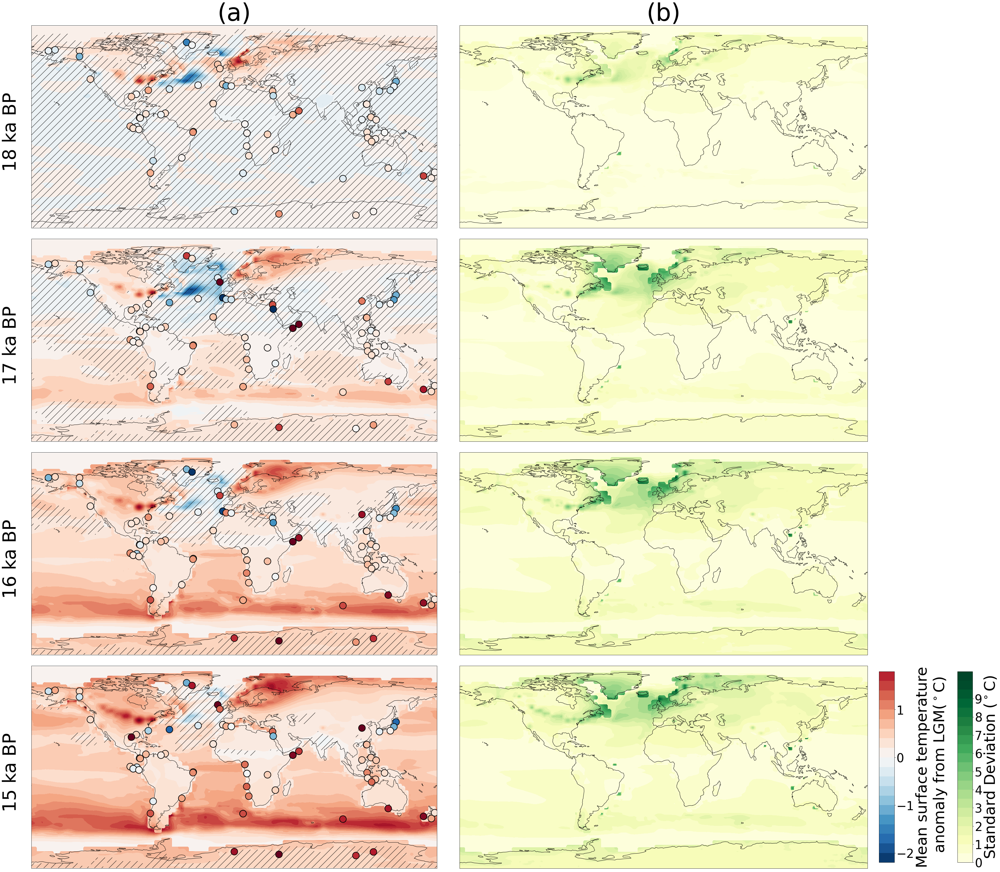

In [13]:
times = ['18 ka BP', '17 ka BP', '16 ka BP', '15 ka BP']
variable = vdict.temp_mm_dpth_5

orig_map2=plt.cm.get_cmap('RdBu')
reversed_map2 = orig_map2.reversed()
cmap = reversed_map2 
lw_clip = -20
hi_clip = 20
k = 0
space = 0.25
projection = ccrs.PlateCarree()
axes_class = (GeoAxes, dict(map_project=projection))

fig,axgr = plt.subplots(nrows=4,ncols=2,constrained_layout=True, subplot_kw={'projection':projection}, gridspec_kw = {'hspace': 0.05, 'wspace': 0.04})
plt.gcf().set_size_inches(40,40)


axgr = axgr.flat
axgr[0].set_title('(a)', fontsize=80)
axgr[1].set_title('(b)', fontsize=80)


counter = 0
i = 0
j = 0 
for ax in axgr:
    
    if counter%2 == 0:
        cmap = reversed_map2 

        ax.coastlines()

        data_sat, lons = add_cyclic_point(np.clip(means_sat[i], lw_clip, hi_clip), coord=lon)
        data_sst, lons2 = add_cyclic_point(np.clip(means_sst[i], lw_clip, hi_clip), coord=lon)
        mask_sst, lons3 = add_cyclic_point(output_masks_sat[i], coord=lon)
        mask_sst_orig, lons4 = add_cyclic_point(output_masks_sat_orig[i], coord=lon)

        contour = ax.contourf(lons, lat, data_sat, 20, transform=ccrs.PlateCarree(), cmap = cmap, norm=mpl.colors.CenteredNorm(vcenter = 0, clip = True), vmin=-5, vmax=5) 
        contour2 = ax.contourf(lons, lat, data_sst, 20, transform=ccrs.PlateCarree(), cmap = cmap, norm=mpl.colors.CenteredNorm(vcenter = 0, clip = True), vmin=-5, vmax=5) 


        hatch = ax.contourf(lons3, lat, mask_sst, 1, transform=ccrs.PlateCarree(), colors='none', zorder=500, hatches=['/'])#, alpha=0.1)
        #hatch = ax.contourf(lons4, lat, mask_sst_orig, 1, transform=ccrs.PlateCarree(), colors='none', zorder=500, hatches=['\\'])

        for collection in hatch.collections:
            collection.set_edgecolor('black')
            collection.set_linewidth(0.)
        ax.set_global()

            
        ax.text(-.05,.3, times[i], ha='center', rotation='vertical', transform=ax.transAxes, fontsize=60)
        
        if i == 1:
            cbar_contour = contour2
        

        for x in range(len(all_lons)):
            ax.scatter(all_lons[x], all_lats[x], s=500, c=all_temp[x][i], cmap=contour.cmap, edgecolors='black', linewidth=2, zorder=5000, vmin=-5, vmax=5)
        
       
        i += 1
        
        
    else:
        cmap = 'YlGn'
        ax.coastlines()
        
        data_sat, lons = add_cyclic_point(np.clip(variances_sat[j], lw_clip, hi_clip), coord=lon)
        data_sst, lons2 = add_cyclic_point(np.clip(variances_sst[j], lw_clip, hi_clip), coord=lon)
        
        contour = ax.contourf(lons, lat, data_sat, 20, transform=ccrs.PlateCarree(), cmap = cmap, vmin=0, vmax=10) 
        contour2 = ax.contourf(lons, lat, data_sst, 20, transform=ccrs.PlateCarree(), cmap = cmap, vmin=0, vmax=10) 
        
        if j == 3:
            cbar_contour_var = contour
        
            ticks = range(-5,5,1)
            cb_ax = fig.add_axes([1.01, 0.008, .0175, 0.22])            
            cbar = plt.colorbar(cbar_contour, cax=cb_ax, ticks=ticks, shrink=.7)
            cbar.set_label('Mean surface temperature\n anomaly from LGM($^\circ$C)', fontsize=50)
            cbar.ax.tick_params(labelsize=40)
            
            
            ticks = range(0,10,1)
            cb_ax = fig.add_axes([1.1, 0.008, .0175, 0.22])
            cbar = fig.colorbar(cbar_contour_var, cax=cb_ax, ticks=ticks)#, shrink=.7)
            cbar.set_label('Standard Deviation ($^\circ$C)', fontsize=50)
            cbar.ax.tick_params(labelsize=40)
            
        j += 1
        
    counter += 1
    

panel = plt.gcf()
panel.savefig('/nfs/mary/Users/ee19b2s/work/chapter1/figures/figures_for_manuscript/final_figures_pdfs/fig04_MMM_SD_wShakun.pdf', format='pdf', dpi = 300, bbox_inches = 'tight')



# fig03: zonal mean SAT

In [28]:
ddict = ddict_sat
expts_data = [ddict.tejen, ddict.loveclim, ddict.itrace, ddict.trace, ddict.deglg, ddict.mpi10, ddict.iloveclim_uniform, ddict.iloveclim_uniform_glac, ddict.deglh, ddict.mpi11, ddict.mpi12, ddict.iloveclim_fwf, ddict.iloveclim_fwf_glac, ddict.famous, ddict.miroc, ddict.uvic_long, ddict.uvic_short]
expts = [tejen, loveclim, itrace, trace, deglg, mpi10, iloveclim_uniform, iloveclim_uniform_glac, deglh, mpi11, mpi12, iloveclim_fwf, iloveclim_fwf_glac, famous, miroc, uvic_long, uvic_short]


var = 'global_3D_temp10'
zonal_mean_lgm_expts = []
zonal_mean_18ka_expts = []
zonal_mean_17ka_expts = []
zonal_mean_16ka_expts = []
zonal_mean_endHS1_expts = []
for expt,data in zip(expts, expts_data):
    out_lgm = []
    out_18ka = []
    out_17ka = []
    out_16ka = []
    out_end = []
    
    for i in range(len(lat)):

        lgm_index = hf.find_nearest_value(expt['time10'],20)
        index19ka = hf.find_nearest_value(expt['time10'],19.5)
        index18ka = hf.find_nearest_value(expt['time10'],18)
        index17ka = hf.find_nearest_value(expt['time10'],17)
        index16ka = hf.find_nearest_value(expt['time10'],16)
        end_index = hf.find_nearest_value(expt['time10'],15)
       
    
        test_lgm = np.ma.average(data[var][lgm_index:index19ka,i,:])
        test_18ka = np.ma.average(data[var][index18ka-3:index18ka+3,i,:])
        test_17ka = np.ma.average(data[var][index17ka-3:index17ka+3,i,:])
        test_16ka = np.ma.average(data[var][index16ka-3:index16ka+3,i,:])
        test_end = np.ma.average(data[var][end_index-3:end_index+3,i,:])

                
        out_lgm.append(test_lgm)
        out_18ka.append(test_18ka)
        out_17ka.append(test_17ka)
        out_16ka.append(test_16ka)
        out_end.append(test_end)

    zonal_mean_endHS1_expts.append(out_end)
    zonal_mean_18ka_expts.append(out_18ka)
    zonal_mean_17ka_expts.append(out_17ka)
    zonal_mean_16ka_expts.append(out_16ka)
    zonal_mean_lgm_expts.append(out_lgm)
    


period=['18 ka BP', '17 ka BP', '16 ka BP', '15 ka BP']
fig, axs = plt.subplots(2,2, sharex = True, figsize = (40, 40), dpi = 300, gridspec_kw = {'hspace': 0.12, 'wspace': 0.05})
for mean_lgm, mean18ka, mean17ka, mean16ka, mean_end,expt in zip(zonal_mean_lgm_expts, zonal_mean_18ka_expts, zonal_mean_17ka_expts, zonal_mean_16ka_expts, zonal_mean_endHS1_expts, expts):
    anom18ka = np.array(mean18ka) - np.array(mean_lgm)
    anom17ka = np.array(mean17ka) - np.array(mean_lgm)
    anom16ka = np.array(mean16ka) - np.array(mean_lgm)
    anom15ka = np.array(mean_end) - np.array(mean_lgm)
    
    axs[0,0].plot(anom18ka, lat, color=expt['color'], linewidth=4, label=expt['label'], linestyle=expt['linestyle'])
    axs[0,1].plot(anom17ka, lat, color=expt['color'], linewidth=4, linestyle=expt['linestyle'])
    axs[1,0].plot(anom16ka, lat, color=expt['color'], linewidth=4, linestyle=expt['linestyle'])
    axs[1,1].plot(anom15ka, lat, color=expt['color'], linewidth=4, linestyle=expt['linestyle'])

axs[1,0].text(1,-0.15,'SAT ($^\circ$C)', fontsize=50, transform=axs[1,0].transAxes, ha='center')
axs[0,0].text(-0.2,-0.15,'Latitude ($^\circ$N)', rotation=90, fontsize=50, transform=axs[0,0].transAxes, ha='center')

    
axs[0,1].yaxis.set_ticklabels([])
axs[1,1].yaxis.set_ticklabels([])    
    
    
axs = axs.flat
k = 0
for ax in axs:
    ax.set_xlim(-5, 12)
    ax.set_title(period[k], fontsize=50)
    ax.axvline(0, linestyle='--', color='black', linewidth=5, alpha=.3)
    ax.tick_params(width=2, length=12, labelsize=40)
    ax.grid(axis = 'both', linewidth=2)
    k+=1


#plt.legend(bbox_to_anchor=(1.05,1))
#plt.title()
lines = []
labels = []
for ax in fig.axes:
    axLine, axLabel = ax.get_legend_handles_labels()
    lines.extend(axLine)
    labels.extend(axLabel)
legend = fig.legend(lines, labels,           
          bbox_to_anchor=(1.15,.8), fontsize=45, markerscale=2)
fig = plt.gcf()
plt.show()
    
fig.savefig('/nfs/mary/Users/ee19b2s/work/chapter1/figures/figures_for_manuscript/final_figures_pdfs/fig03_zonal_mean_SAT.pdf', format='pdf', dpi=300, bbox_inches='tight')

/tmp/ipykernel_71607/1473038017.py:53: UserWarning: Warning: converting a masked element to nan.
  anom18ka = np.array(mean18ka) - np.array(mean_lgm)
/tmp/ipykernel_71607/1473038017.py:54: UserWarning: Warning: converting a masked element to nan.
  anom17ka = np.array(mean17ka) - np.array(mean_lgm)
/tmp/ipykernel_71607/1473038017.py:55: UserWarning: Warning: converting a masked element to nan.
  anom16ka = np.array(mean16ka) - np.array(mean_lgm)
/tmp/ipykernel_71607/1473038017.py:56: UserWarning: Warning: converting a masked element to nan.
  anom15ka = np.array(mean_end) - np.array(mean_lgm)


# figS02: North Atlantic zonal mean SAT

In [20]:
lonW_NATL = 300
lonE_NATL = 359
latN_NATL = 60
latS_NATL = 35


latN_index = hf.find_nearest_value(lat, latN_NATL)
latS_index = hf.find_nearest_value(lat, latS_NATL)

expts_data_NATL = []
for data in expts_data:
    data_NATL = data['global_3D_temp10'][:, latS_index:latN_index, lonW_NATL:lonE_NATL]
    expts_data_NATL.append(data_NATL)

In [27]:
var = 'global_3D_temp10'
zonal_mean_lgm_expts = []
zonal_mean_18ka_expts = []
zonal_mean_17ka_expts = []
zonal_mean_16ka_expts = []
zonal_mean_endHS1_expts = []
for expt,data in zip(expts, expts_data_NATL):
    out_lgm = []
    out_18ka = []
    out_17ka = []
    out_16ka = []
    out_end = []
    
    for i in range(len(lat[latS_index:latN_index])):

        lgm_index = hf.find_nearest_value(expt['time10'],20)
        index19ka = hf.find_nearest_value(expt['time10'],19.5)
        index18ka = hf.find_nearest_value(expt['time10'],18)
        index17ka = hf.find_nearest_value(expt['time10'],17)
        index16ka = hf.find_nearest_value(expt['time10'],16)
        end_index = hf.find_nearest_value(expt['time10'],15)
       
    
        test_lgm = np.ma.average(data[lgm_index:index19ka,i,:])
        test_18ka = np.ma.average(data[index18ka-3:index18ka+3,i,:])
        test_17ka = np.ma.average(data[index17ka-3:index17ka+3,i,:])
        test_16ka = np.ma.average(data[index16ka-3:index16ka+3,i,:])
        test_end = np.ma.average(data[end_index-3:end_index+3,i,:])

                
        out_lgm.append(test_lgm)
        out_18ka.append(test_18ka)
        out_17ka.append(test_17ka)
        out_16ka.append(test_16ka)
        out_end.append(test_end)

    zonal_mean_endHS1_expts.append(out_end)
    zonal_mean_18ka_expts.append(out_18ka)
    zonal_mean_17ka_expts.append(out_17ka)
    zonal_mean_16ka_expts.append(out_16ka)
    zonal_mean_lgm_expts.append(out_lgm)


period=['18 ka BP', '17 ka BP', '16 ka BP', '15 ka BP']
fig, axs = plt.subplots(2,2, sharex = True, figsize = (40, 40), dpi = 300, gridspec_kw = {'hspace': 0.12, 'wspace': 0.05})
for mean_lgm, mean18ka, mean17ka, mean16ka, mean_end,expt in zip(zonal_mean_lgm_expts, zonal_mean_18ka_expts, zonal_mean_17ka_expts, zonal_mean_16ka_expts, zonal_mean_endHS1_expts, expts):
    anom18ka = np.array(mean18ka) - np.array(mean_lgm)
    anom17ka = np.array(mean17ka) - np.array(mean_lgm)
    anom16ka = np.array(mean16ka) - np.array(mean_lgm)
    anom15ka = np.array(mean_end) - np.array(mean_lgm)
    
    axs[0,0].plot(anom18ka, lat[latS_index:latN_index], color=expt['color'], linewidth=4, label=expt['label'], linestyle=expt['linestyle'])
    axs[0,1].plot(anom17ka, lat[latS_index:latN_index], color=expt['color'], linewidth=4, linestyle=expt['linestyle'])
    axs[1,0].plot(anom16ka, lat[latS_index:latN_index], color=expt['color'], linewidth=4, linestyle=expt['linestyle'])
    axs[1,1].plot(anom15ka, lat[latS_index:latN_index], color=expt['color'], linewidth=4, linestyle=expt['linestyle'])

axs[1,0].text(1,-0.15,'SAT ($^\circ$C)', fontsize=50, transform=axs[1,0].transAxes, ha='center')
axs[0,0].text(-0.2,-0.15,'Latitude ($^\circ$N)', rotation=90, fontsize=50, transform=axs[0,0].transAxes, ha='center')

    
axs[0,1].yaxis.set_ticklabels([])
axs[1,1].yaxis.set_ticklabels([])    
    
    
axs = axs.flat
'''k = 0
for ax in axs:
    #ax.set_xlim(-5, 12)
    ax.set_title(period[k], fontsize=50)
    ax.axvline(0, linestyle='--', color='black', linewidth=5, alpha=.3)
    ax.tick_params('both', labelsize=40)
    ax.grid()
    k+=1
'''
k = 0
for ax in axs:
    #ax.set_xlim(-5, 12)
    ax.set_title(period[k], fontsize=50)
    ax.axvline(0, color='black', linewidth=6, alpha=.4)#linestyle='--', 
    ax.tick_params(width=2, length=12, labelsize=40)
    #for axis in ['top','bottom','left','right']:
        #ax.spines[axis].set_linewidth(2)
    ax.grid(axis = 'both',linewidth=2)
    k+=1


#plt.legend(bbox_to_anchor=(1.05,1))
#plt.title()
lines = []
labels = []
for ax in fig.axes:
    axLine, axLabel = ax.get_legend_handles_labels()
    lines.extend(axLine)
    labels.extend(axLabel)
legend = fig.legend(lines, labels,           
          bbox_to_anchor=(1.15,.8), fontsize=45, markerscale=2)
fig = plt.gcf()
plt.show()
    
fig.savefig('/nfs/annie/ee19b2s/work/chapter1/figures/figures_for_manuscript/final_supplementary_figures_pdfs/figS02_NATL_zonal_SAT.pdf', format='pdf', dpi=300, bbox_inches='tight')